# Assumption: The independent variables are independent of each other.

# Multicollinearity occurs when independent variables in a regression model are correlated. This correlation is a problem because independent variables should be independent. If the degree of correlation between variables is high enough, it can cause problems when you fit the model and interpret the results.

In [1]:
import pandas as pd # for data manipulation
import numpy as np # for data manipulation
from sklearn.linear_model import LinearRegression # for creating a model
import plotly.graph_objects as go # for visualizations
import plotly.express as px # for visualizations

In [2]:
# Read data into a Pandas DataFrame
df = pd.read_csv('C:/Users/Admin/Machine Learning chapter 5/Real estate.csv', encoding='utf-8')

# Print DataFrame
df

,No,X1 transaction date,X2 house age,X3 distance to the nearest MRT station,X4 number of convenience stores,X5 latitude,X6 longitude,Y house price of unit area
0,1,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9
1,2,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2
2,3,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3
3,4,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8
4,5,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1
...,...,...,...,...,...,...,...,...
409,410,2013.000,13.7,4082.01500,0,24.94155,121.50381,15.4
410,411,2012.667,5.6,90.45606,9,24.97433,121.54310,50.0
411,412,2013.250,18.8,390.96960,7,24.97923,121.53986,40.6
412,413,2013.000,8.1,104.81010,5,24.96674,121.54067,52.5


# One independent variable: 

For this model, we will take ‘X3 distance to the nearest MRT station’ as our input (independent) variable and ‘Y house price of unit area’ as our output (dependent, a.k.a. target) variable. Hence, the goal is to use the values of X3 to predict the value of Y.

First, let us create a scatter plot so we can see how these values are distributed.

In [3]:
# Create a scatter plot
fig = px.scatter(df, x=df['X3 distance to the nearest MRT station'], y=df['Y house price of unit area'], 
                 opacity=0.8, color_discrete_sequence=['black'])

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title_text="Scatter Plot")

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

As you can see, there is a noticeable relationship between the two variables. As the distance from the nearest MRT station increases, the price tends to decrease.

We will now run a simple linear regression model to find the best-fit line, which we can use to make predictions of price based on the distance to MRT.



In [4]:
# Select variables that we want to use in a model 
# Note, we need X to be a 2D array, hence reshape
X=df['X3 distance to the nearest MRT station'].values.reshape(-1,1)
y=df['Y house price of unit area'].values

# Fit linear regression model
model = LinearRegression()
reg = model.fit(X, y)

# Print the slope and intercept of the best-fit line
print(reg.coef_)
print(reg.intercept_)

[-0.00726205]
45.851427057774984


The model has been fitted, giving us the slope of -0.00726205 and intercept of 45.85142705777498.

In [5]:
# We will use below to draw a best-fit line on a chart
# Create 20 evenly spaced points from smallest X to largest X
x_range = np.linspace(X.min(), X.max(), 20) 

# Predict y values for our set of X values
y_range = model.predict(x_range.reshape(-1, 1))



# Create a scatter plot
fig = px.scatter(df, x=df['X3 distance to the nearest MRT station'], y=df['Y house price of unit area'], 
                 opacity=0.8, color_discrete_sequence=['black'])

# Add a best-fit line
fig.add_traces(go.Scatter(x=x_range, y=y_range, name='Regression Fit'))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title_text="Scatter Plot with Linear Regression Line")

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

In [7]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score
import math

In [9]:
Y_predict = reg.predict(X)

In [10]:
print('MSE',mean_squared_error(y,Y_predict))
print('RMSE',math.sqrt(mean_squared_error(y, Y_predict)))
print('R-square score is :', r2_score(y,Y_predict))

MSE 100.88574959799587
RMSE 10.044189842789505
R-square score of LightGBM is : 0.45375427891826703


# As you can see from the evaluation metric a linear model is not a good choice for this case in oorder to make predictions.

One additional observation from a chart above that you might have already spotted that highlights one of the limitations of linear regression. If we were to put an X value larger than 6,313, we would get a negative price, which is not realistic. A non-linear regression model could help us avoid this problem.

# Multiple linear regression

For this example, we will use the same data but add one more independent variable — ‘X2 house age’. As before, let us first visualize the data. This time with a Plotly scatter 3D chart.

In [11]:
# Create a 3D scatter plot
fig = px.scatter_3d(df, x=df['X3 distance to the nearest MRT station'], y=df['X2 house age'], z=df['Y house price of unit area'], 
                 opacity=0.8, color_discrete_sequence=['black'])

# Set figure title
fig.update_layout(title_text="Scatter 3D Plot",
                  scene = dict(xaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'),
                               yaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'
                                          ),
                               zaxis=dict(backgroundcolor='white',
                                          color='black', 
                                          gridcolor='lightgrey')))

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

You can see from the above chart that the relationship also exists between the house age and price. This is great news as it will enable our model to give more accurate predictions. So, let’s fit the model.

In [12]:
# Select variables that we want to use in a model 
# Note, X in this case is already a 2D array, hence no reshape
X=df[['X3 distance to the nearest MRT station','X2 house age']]
y=df['Y house price of unit area'].values

# Fit linear regression model
model = LinearRegression()
reg = model.fit(X, y)

# Print slope(s) and intercept
print(reg.coef_)
print(reg.intercept_)

[-0.00720862 -0.23102658]
49.885585756906636


This time, since we have two independent variables, we get two slope parameters [-0.00720862 -0.23102658] and one intercept: 49.885585756906636. Again, you can use these to write a linear equation:

y = -0.00720862*[X3] -0.23102658*[X2] + 49.885585756906636.

In [13]:
Y_predict = reg.predict(X)

In [14]:
print('MSE',mean_squared_error(y,Y_predict))
print('RMSE',math.sqrt(mean_squared_error(y, Y_predict)))
print('R-square score of  is :', r2_score(y,Y_predict))

MSE 93.97976963938086
RMSE 9.69431635750458
R-square score of LightGBM is : 0.49114669575911474


# Inclduing the second independent variable improve a little bit the metrics but values still are not optimal for a linear regression model.

In [15]:
# ------------------------ Prepare a number of points to use for prediction --------------------------
# Increments between points in a meshgrid
mesh_size = 1

# Identify min and max values for input variables
x_min, x_max = X['X3 distance to the nearest MRT station'].min(), X['X3 distance to the nearest MRT station'].max()
y_min, y_max = X['X2 house age'].min(), X['X2 house age'].max()

# Return evenly spaced values based on a range between min and max
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)

# Create a meshgrid
xx, yy = np.meshgrid(xrange, yrange)


# ------------------------------ Use the model to predict the output ---------------------------------
# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Note, .ravel() flattens the array to a 1D array,
# then np.c_ takes elements from flattened xx and yy arrays and puts them together,
# this creates the right shape required for model input

# prediction array that is created by the model output is a 1D array,
# we need to reshape it to be the same shape as xx or yy to be able to display it on a graph

C:\Users\Admin\anacondalastone\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



In [16]:
# ------------------------------------------- Plot --------------------------------------------------
# Create a 3D scatter plot with predictions
fig = px.scatter_3d(df, x=df['X3 distance to the nearest MRT station'], y=df['X2 house age'], z=df['Y house price of unit area'], 
                 opacity=0.8, color_discrete_sequence=['black'])

# Set figure title and colors
fig.update_layout(title_text="Scatter 3D Plot with Prediction Surface",
                  scene = dict(xaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'),
                               yaxis=dict(backgroundcolor='white',
                                          color='black',
                                          gridcolor='lightgrey'
                                          ),
                               zaxis=dict(backgroundcolor='white',
                                          color='black', 
                                          gridcolor='lightgrey')))
# Update marker size
fig.update_traces(marker=dict(size=3))

# Add prediction plane
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface'))

fig.show()

# Meanwhile, two input variables give us a 2D flat surface — a prediction plane. You can go up in dimensions by adding many more input variables to your model, which will work just fine, but you will not be able to draw a graph to visualize it.

# LR with 3 independent variables. 

In [17]:
# Select variables that we want to use in a model 
# Note, X in this case is already a 2D array, hence no reshape
X=df[['X3 distance to the nearest MRT station','X2 house age','X4 number of convenience stores']]
y=df['Y house price of unit area'].values

# Fit linear regression model
model = LinearRegression()
reg = model.fit(X, y)

# Print slope(s) and intercept
print(reg.coef_)
print(reg.intercept_)

[-0.00537913 -0.25285583  1.29744248]
42.97728620606411


In [18]:
Y_predict = reg.predict(X)

In [22]:
print('MSE',mean_squared_error(y,Y_predict))
print('RMSE',math.sqrt(mean_squared_error(y, Y_predict)))
print('R-square score of LR is :', r2_score(y,Y_predict))

MSE 84.76070642266241
RMSE 9.206557794456211
R-square score of LR is : 0.5410632980005725


In [23]:
reg.score(X,y)

0.5410632980005725

Score is he same as R-square score

# Metrics improved a little bit adding a third variable. 

# Multiple Linear Regression Fish Weight Prediction

In this study I am using Python 3 environment to create a machine learning model to predict the weight of the fish based on the body measurement data of seven types of fish species.

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model
from sklearn.model_selection import train_test_split

In [25]:
df = pd.read_csv("C:/Users/Admin/Machine Learning chapter 5/Fish.csv")
print('Shape of dataset= ', df.shape) # To get no of rows and columns
df.head(5) # head(n) returns first n records only. Can also use sample(n) for random n records.

Shape of dataset=  (159, 7)


,Species,Weight,Length1,Length2,Length3,Height,Width
0,Bream,242.0,23.2,25.4,30.0,11.5200,4.0200
1,Bream,290.0,24.0,26.3,31.2,12.4800,4.3056
2,Bream,340.0,23.9,26.5,31.1,12.3778,4.6961
3,Bream,363.0,26.3,29.0,33.5,12.7300,4.4555
4,Bream,430.0,26.5,29.0,34.0,12.4440,5.1340


In [26]:
df.rename(columns={'Length1':'VerticalLen','Length2':'DiagonalLen','Length3':'CrossLen'},inplace = True) # 'inplace= true' to make change in current dataframe
df.sample(5) # Display random 5 records

,Species,Weight,VerticalLen,DiagonalLen,CrossLen,Height,Width
97,Perch,145.0,22.0,24.0,25.5,6.3750,3.8250
87,Perch,120.0,20.0,22.0,23.5,5.6400,3.5250
14,Bream,600.0,29.4,32.0,37.2,14.9544,5.1708
5,Bream,450.0,26.8,29.7,34.7,13.6024,4.9274
153,Smelt,9.8,11.4,12.0,13.2,2.2044,1.1484


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159 entries, 0 to 158
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Species      159 non-null    object 
 1   Weight       159 non-null    float64
 2   VerticalLen  159 non-null    float64
 3   DiagonalLen  159 non-null    float64
 4   CrossLen     159 non-null    float64
 5   Height       159 non-null    float64
 6   Width        159 non-null    float64
dtypes: float64(6), object(1)
memory usage: 8.8+ KB


In [28]:
df.isna().sum() 

Species        0
Weight         0
VerticalLen    0
DiagonalLen    0
CrossLen       0
Height         0
Width          0
dtype: int64

In [29]:
#get count of each species:
df.Species.value_counts()

Perch        56
Bream        35
Roach        20
Pike         17
Smelt        14
Parkki       11
Whitefish     6
Name: Species, dtype: int64

In [30]:
df_sp = df.Species.value_counts()
df_sp = pd.DataFrame(df_sp)
df_sp

,Species
Perch,56
Bream,35
Roach,20
Pike,17
Smelt,14
Parkki,11
Whitefish,6


In [31]:
df_sp.T #Twill Transpose index and columns

,Perch,Bream,Roach,Pike,Smelt,Parkki,Whitefish
Species,56,35,20,17,14,11,6


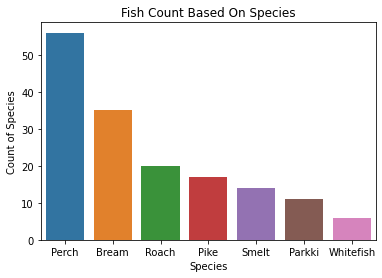

In [32]:
sns.barplot(x= df_sp.index, y = df_sp.Species) # df_sp.index will returns row labels of dataframe
plt.xlabel('Species')
plt.ylabel('Count of Species')
plt.rcParams["figure.figsize"] = (10,6)
plt.title('Fish Count Based On Species')
plt.show()

Important Points As you can see our dataset is very small. We have only 6 training example for 'Whitefish' species. Ideal approach would be to divide the dataset and do the prediction for each species. But since we don't have enough data we will ignore the different species during our analysis.

In [33]:
df1 = df.drop([40])
print('New dimension of dataset is= ', df1.shape)
df1.head(5)

New dimension of dataset is=  (158, 7)


,Species,Weight,VerticalLen,DiagonalLen,CrossLen,Height,Width
0,Bream,242.0,23.2,25.4,30.0,11.5200,4.0200
1,Bream,290.0,24.0,26.3,31.2,12.4800,4.3056
2,Bream,340.0,23.9,26.5,31.1,12.3778,4.6961
3,Bream,363.0,26.3,29.0,33.5,12.7300,4.4555
4,Bream,430.0,26.5,29.0,34.0,12.4440,5.1340


# Correlation Check Correlation helps us investigate and establish relationships between variables Note that high amount of correlation between independent variables suggest that linear regression estimation will be unreliable

Text(0.5, 1.0, 'Correlation Matrix')

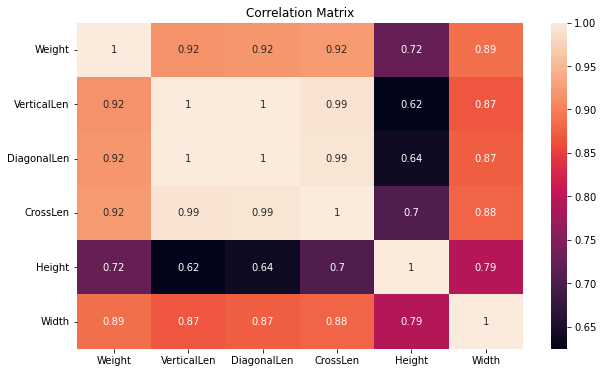

In [34]:
plt.rcParams["figure.figsize"] = (10,6) # Custom figure size in inches
sns.heatmap(df1.corr(), annot =True)
plt.title('Correlation Matrix')

# The correlation between 'VerticalLen', 'DiagonalLen' and 'Crosslen' is almost 1. This will cause 'Multicolinearity' and if we don't take care of it, it may lead to unreliable predictions.

In [35]:
df2 = df1.drop(['VerticalLen', 'DiagonalLen', 'CrossLen'], axis =1) # Can also use axis = 'columns'
print('New dimension of dataset is= ', df2.shape)
df2.head()

New dimension of dataset is=  (158, 4)


,Species,Weight,Height,Width
0,Bream,242.0,11.5200,4.0200
1,Bream,290.0,12.4800,4.3056
2,Bream,340.0,12.3778,4.6961
3,Bream,363.0,12.7300,4.4555
4,Bream,430.0,12.4440,5.1340


Outlier Detection and Removal Outlier is an extremely high or extremely low value in our data We use below formula to identify the outlier

( Greater than Q3 + 1.5 * IQR ) OR ( Lower than Q1 -1.5 * IQR )

where, Q1 = First quartile Q3 = Third quartile IQR = Interquartile range (Q3 - Q1)

Text(0.5, 1.0, 'Outlier Detection based on Weight')

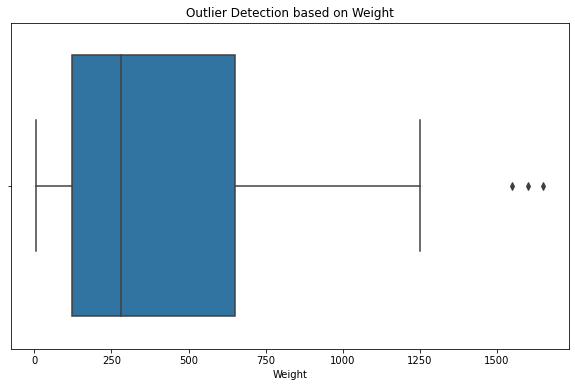

In [36]:
sns.boxplot(x=df2['Weight'])
plt.title('Outlier Detection based on Weight')

In [37]:
def outlier_detection(dataframe):
    Q1 = dataframe.quantile(0.25)
    Q3 = dataframe.quantile(0.75)
    IQR = Q3 - Q1
    upper_end = Q3 + 1.5 * IQR
    lower_end = Q1 - 1.5 * IQR 
    outlier = dataframe[(dataframe > upper_end) | (dataframe < lower_end)]
    return outlier

In [38]:
outlier_detection(df2['Weight'])

142    1600.0
143    1550.0
144    1650.0
Name: Weight, dtype: float64

So based on 'Weight' data, index 142, 143 and 144 are outliers

Text(0.5, 1.0, 'Outlier Detection based on Height')

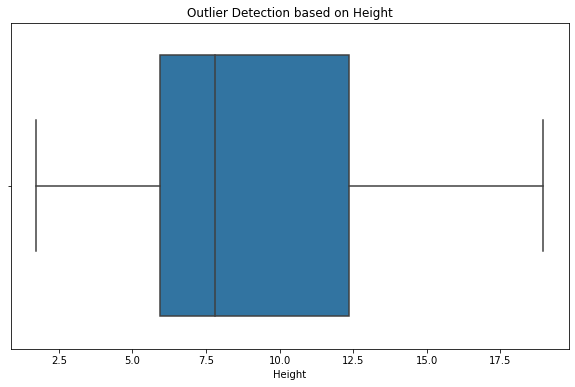

In [39]:
sns.boxplot(x =df2['Height'])
plt.title('Outlier Detection based on Height')

Text(0.5, 1.0, 'Outlier Detection based on Width')

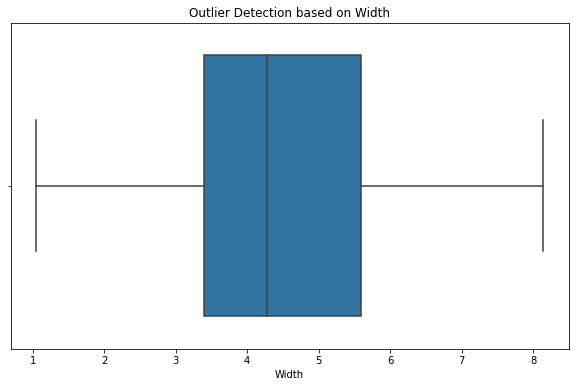

In [40]:
sns.boxplot(x = df2['Width'])
plt.title('Outlier Detection based on Width')

In [41]:
df3 = df2.drop([142,143,144])
df3.shape

(155, 4)

In [42]:
df3.describe().T

,count,mean,std,min,25%,50%,75%,max
Weight,155.0,377.638065,319.144511,5.9000,120.00000,272.0000,615.00000,1250.000
Height,155.0,8.967102,4.333722,1.7284,5.92695,7.6800,12.37930,18.957
Width,155.0,4.382326,1.675564,1.0476,3.38565,4.2476,5.47275,8.142


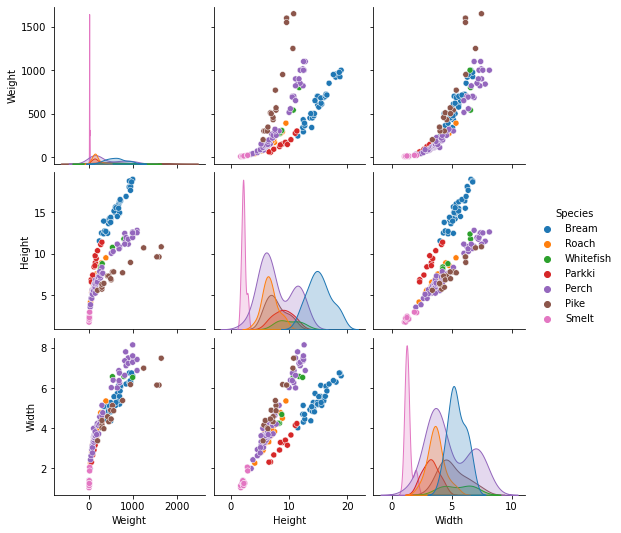

In [43]:
sns.pairplot(df2, kind = 'scatter', hue = 'Species')

From the above pair plot, we can see that there seems to be some correlations between Height, Width and the Weight. Note that since we have multiple species the correlation between Height and Width of all species is not exactly linear with Weight.

# Build Machine Learning Model

In [44]:
#X = df3.iloc[:,[2,3]] # Select columns using column index
X = df3[['Height','Width']] # Select columns using column name
X.head()

,Height,Width
0,11.5200,4.0200
1,12.4800,4.3056
2,12.3778,4.6961
3,12.7300,4.4555
4,12.4440,5.1340


In [45]:
#y = df3.iloc[:,[1]] # Select columns using column index
y = df3[['Weight']]
y.head(5)

,Weight
0,242.0
1,290.0
2,340.0
3,363.0
4,430.0


In [46]:
X_train,X_test, y_train, y_test = train_test_split(X, y, test_size =0.2, random_state = 42) 
# Use paramter 'random_state=1' if you want keep results same everytime you execute above code
print('X_train dimension= ', X_train.shape)
print('X_test dimension= ', X_test.shape)
print('y_train dimension= ', y_train.shape)
print('y_train dimension= ', y_test.shape)

X_train dimension=  (124, 2)
X_test dimension=  (31, 2)
y_train dimension=  (124, 1)
y_train dimension=  (31, 1)


In [47]:
model = linear_model.LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

In [48]:
print('coef= ', model.coef_) # Since we have two features(Height and Width), there will be 2 coef
print('intercept= ', model.intercept_)
print('score= ', model.score(X_test,y_test))

coef=  [[ 10.40686081 151.73209963]]
intercept=  [-386.16761436]
score=  0.8960229976573091


In [50]:
predictions = model.predict(X_test)

In [51]:
print('MSE',mean_squared_error(y_test, predictions))
print('RMSE',math.sqrt(mean_squared_error(y_test, predictions)))
print('R-square score of LR is :', r2_score(y_test, predictions))

MSE 11620.603588644111
RMSE 107.79890346679836
R-square score of LR is : 0.8960229976573091


# Really good score 0.89. 

In [52]:
predictedWeight = pd.DataFrame(model.predict(X_test), columns=['Predicted Weight']) # Create new dataframe of column'Predicted Weight'
actualWeight = pd.DataFrame(y_test)
actualWeight = actualWeight.reset_index(drop=True) # Drop the index so that we can concat it, to create new dataframe
df_actual_vs_predicted = pd.concat([actualWeight,predictedWeight],axis =1)

In [53]:
df_actual_vs_predicted

,Weight,Predicted Weight
0,110.0,212.481055
1,7.5,-189.636049
2,955.0,756.728427
3,1000.0,813.002300
4,850.0,816.240658
5,55.0,38.098095
6,150.0,218.321182
7,10.0,-168.334196
8,19.7,-42.610188
9,200.0,277.385406


Text(0.5, 1.0, 'Weight From test Data Vs Weight Predicted By Model')

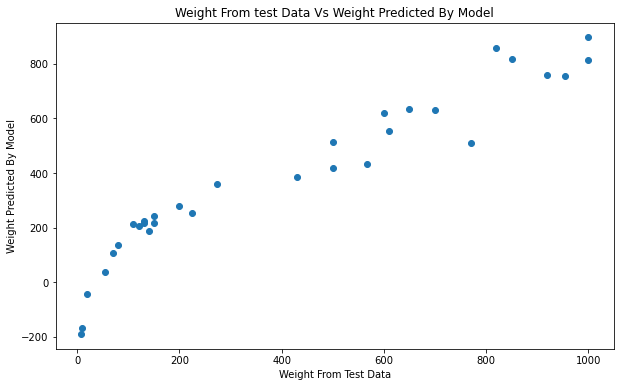

In [54]:
plt.scatter(y_test, model.predict(X_test))
plt.xlabel('Weight From Test Data')
plt.ylabel('Weight Predicted By Model')
plt.rcParams["figure.figsize"] = (10,6) # Custom figure size in inches
plt.title("Weight From test Data Vs Weight Predicted By Model")

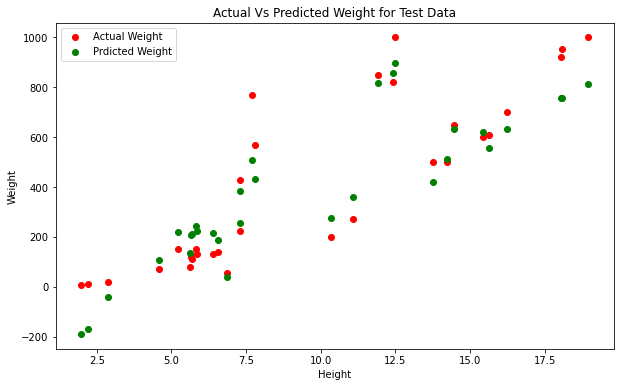

In [55]:
plt.scatter(X_test['Height'], y_test, color='red', label = 'Actual Weight')
plt.scatter(X_test['Height'], model.predict(X_test), color='green', label = 'Prdicted Weight')
plt.xlabel('Height')
plt.ylabel('Weight')
plt.rcParams["figure.figsize"] = (10,6) # Custom figure size in inches
plt.title('Actual Vs Predicted Weight for Test Data')
plt.legend()
plt.show()

# as you can see below there is a better correlation with the width.

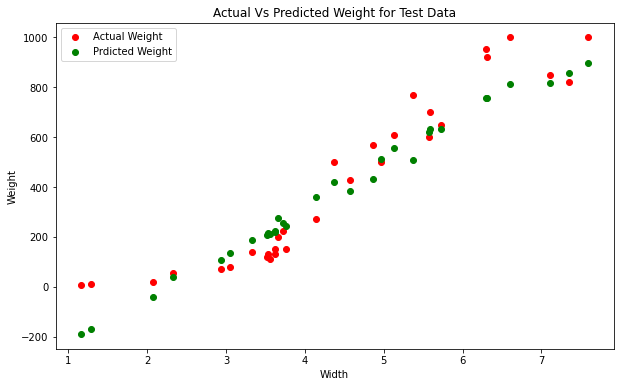

In [56]:
plt.scatter(X_test['Width'], y_test, color='red', label = 'Actual Weight')
plt.scatter(X_test['Width'], model.predict(X_test), color='green', label = 'Prdicted Weight')
plt.xlabel('Width')
plt.ylabel('Weight')
plt.rcParams["figure.figsize"] = (10,6) # Custom figure size in inches
plt.title('Actual Vs Predicted Weight for Test Data')
plt.legend()
plt.show()

C:\Users\Admin\anacondalastone\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Histogram of Residuals')

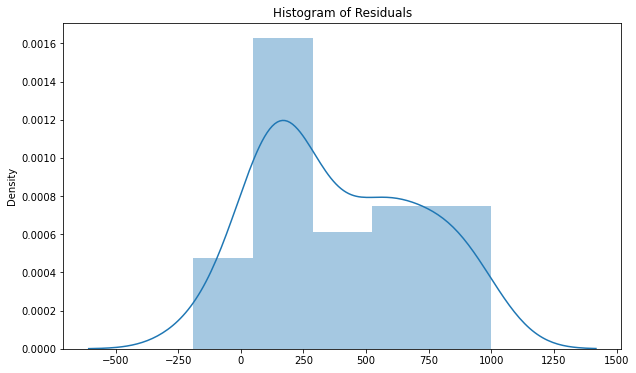

In [57]:
sns.distplot((y_test,model.predict(X_test)))
plt.rcParams["figure.figsize"] = (10,6) # Custom figure size in inches
plt.title("Histogram of Residuals")

The vertical scale of a 'frequency histogram' shows the number of observations in each bin.The lines shows a 'density histogram' that make the total area of all the bars add to 1.¶